In [5]:
import pandas as pd
import sqlite3
import seaborn as sns

# Read sqlite query results into a pandas DataFrame
def query(query):
    con = sqlite3.connect("output/portfolios.sqlite")
    df = pd.read_sql_query(query, con)
    con.close()
    return df

df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 2
  ORDER BY num_assets DESC
""")

df.head(4)

,assets,num_assets,num_years,avg_return,baseline_lt_return,baseline_st_return,pwr30,swr30,std_dev,ulcer_score,deepest_drawdown,longest_drawdown,startdate_sensitivity,pwr10,pwr10_stdev,pwr10_slope,pwr30_stdev,pwr30_slope
0,|Commodity Futures|,1,52,0.044149,-0.053216,-0.106503,-0.051271,0.024611,0.225833,170.085366,-0.810595,14.0,0.286495,-0.150707,0.061643,-0.344271,0.032025,-0.424845
1,|Dividend Growth|,1,37,0.109792,0.055985,0.022371,0.076779,0.084028,0.134235,4.563646,-0.265817,4.0,0.236222,0.009451,0.032857,-0.214342,0.011314,-0.391581
2,|Emerging|,1,46,0.090119,0.044385,-0.073061,0.039664,0.046235,0.271682,25.244496,-0.542221,12.0,0.445189,-0.020519,0.056880,-0.066363,0.032767,0.339823
3,|Energy|,1,37,0.086031,0.046029,-0.033458,0.063501,0.075301,0.201457,68.655021,-0.478757,14.0,0.245473,-0.052415,0.048891,-0.350869,0.009213,-0.271871


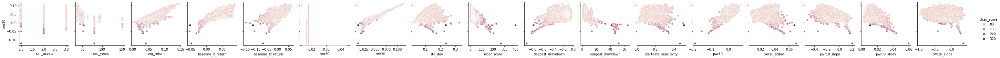

In [6]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

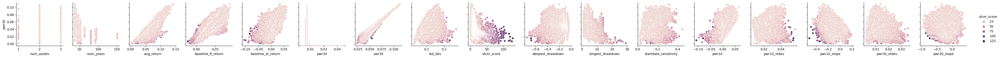

In [8]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

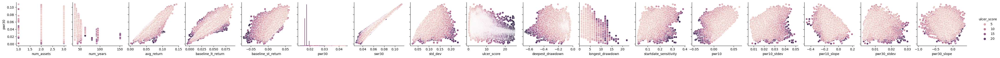

In [9]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
    AND ulcer_score < 25
  ORDER BY ulcer_score DESC
""")
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

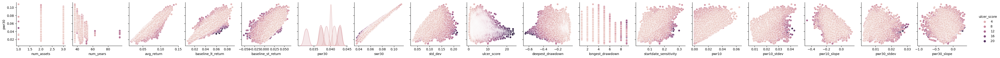

In [13]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0
    AND pwr10 > 0
    AND ulcer_score < 25
  ORDER BY ulcer_score DESC
""")
df.size
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

217872


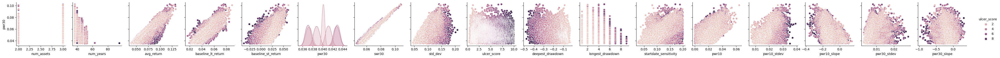

In [17]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 10
    AND startdate_sensitivity < 0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

191646


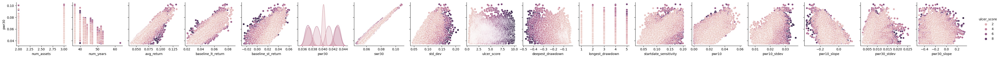

In [20]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 10
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.2
    AND pwr30_slope > -0.5
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

39420


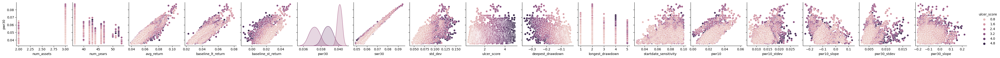

In [21]:
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 4
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

780804


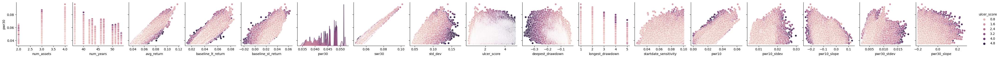

In [22]:
# Expand to 4 assets
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 5
    AND pwr30 > 0.035
    AND pwr10 > 0
    AND ulcer_score < 5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

180090


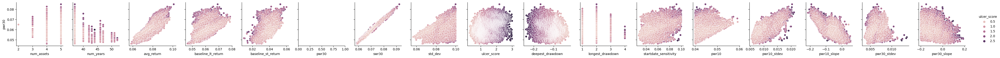

In [24]:
# tighten: pwr10, pwr30, ulcer_score
# expand to 5 assets
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

20034


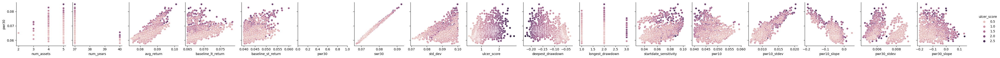

In [25]:
# tighten: baseline_lt_return, baseline_st_return
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 3
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

12186


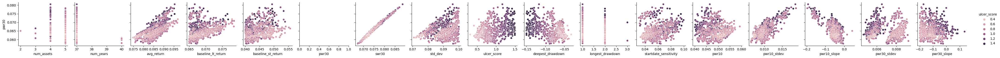

In [26]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.1
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

8604


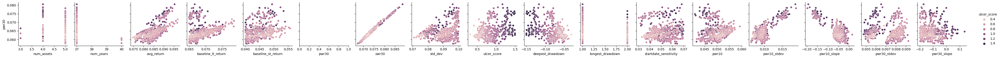

In [27]:
# tighten: startdate_sensitivity
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.5
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.07
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

7380


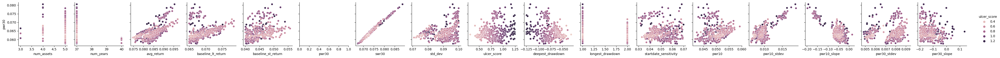

In [28]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.25
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.07
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

4068


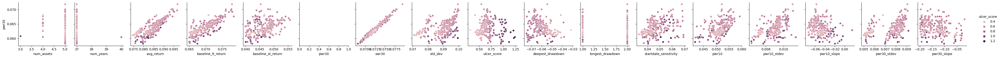

In [29]:
# tighten: deepest_drawdown
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 1.25
    AND deepest_drawdown > -0.075
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.07
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

3204


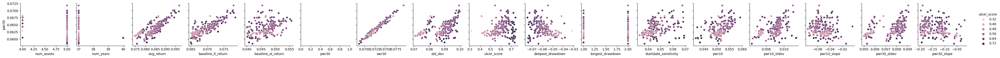

In [30]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios
  WHERE num_assets < 6
    AND baseline_lt_return > 0.065
    AND baseline_st_return > 0.04
    AND pwr30 > 0.04
    AND pwr10 > 0.04
    AND std_dev < 0.1
    AND ulcer_score < 0.75
    AND deepest_drawdown > -0.075
    AND longest_drawdown < 6
    AND startdate_sensitivity < 0.07
    AND pwr30_slope > -0.5
    AND pwr30_slope > -0.2
  ORDER BY ulcer_score DESC
""")
print(df.size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')